In [1]:
# making A Generative Adverserial Network(GAN's) for the first time to generate dog images

from torchvision.datasets import ImageFolder,FashionMNIST
from torch.utils.data import DataLoader
import torch.nn as nn
import torch
from torchvision.utils import make_grid
from torchvision import transforms
import os
import numpy as np

from tqdm import tqdm 
import matplotlib.pyplot as plt
import torchvision.utils as vutils

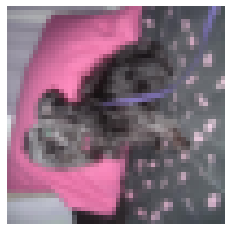

In [2]:
## My folder structure was 
'''
petimages//Cat -- Dog ,
MUST READ --

since,
I wanted only dogs as my Entry in The Gan to generate imgs of dogs🐶🐶🐶

Image folder gives an error if you directly reads a folder with images 

instead it demands a folder of images 

so i changed my structure to --- 
petsimages// Cats -- img
I moved the Dog folder to img 
'''
folder = ImageFolder(root='../starters/PetImages/img',transform=transforms.Compose([
    transforms.Resize((50,50)),
    transforms.ToTensor()]))

train_loader = DataLoader(folder,batch_size=32)
images,labels = next(iter(train_loader))

plt.imshow(images[0].squeeze().permute(2,1,0))
plt.axis('off')
plt.show()

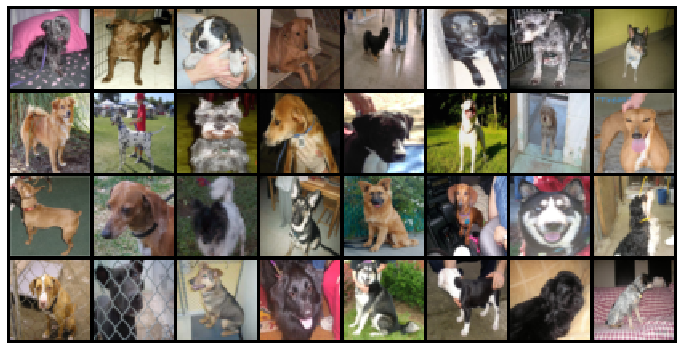

In [3]:
def show(img):
    plt.figure(figsize=(12,10))
    npimg = img.numpy()
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

grid = make_grid(images, nrow=8)
show(grid)

Making a Generator which takes in a noise vector and makes it into a image vector 

which gets feeded to our Discriminator class 

In [4]:
class generator(nn.Module):
    def __init__(self,noise=64,imagedim=2500):
        super(generator,self).__init__()
        self.genlayers = nn.Sequential(
            nn.Linear(noise,256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.3),
            nn.Linear(256,558),
            nn.LeakyReLU(0.3),
            nn.Linear(558,1000),
            nn.BatchNorm1d(1000),
            nn.LeakyReLU(0.3),
            nn.Linear(1000,2500)
                    )
    def forward(self,z):
        return self.genlayers(z)
         

class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=2500):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(im_dim,1000),
            nn.LeakyReLU(0.3),
            nn.Linear(1000,556),
            nn.BatchNorm1d(556),
            nn.LeakyReLU(0.3),
            nn.Linear(556,264),
            nn.BatchNorm1d(264),
            nn.LeakyReLU(0.3),
            nn.Linear(264,1),
            nn.Sigmoid()
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc


In [6]:
batch_size=32
z_dim = 64
gen = generator(z_dim)
disc = Discriminator()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(gen))

g_opt = torch.optim.Adam(list(gen.parameters()),lr=3e-4)
d_opt = torch.optim.RMSprop(list(disc.parameters()),lr=3e-4)

criterion = nn.BCELoss()


## earlier the model sizze was somewhere 41 million parameters and disc had 3.9 billion 😂😂
# just because the images were 250*250 and the number of layers were wayyyy more than required

epochs = 1
gen.to(device)
disc.to(device)

3224058


Discriminator(
  (disc): Sequential(
    (0): Linear(in_features=2500, out_features=1000, bias=True)
    (1): LeakyReLU(negative_slope=0.3)
    (2): Linear(in_features=1000, out_features=556, bias=True)
    (3): BatchNorm1d(556, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.3)
    (5): Linear(in_features=556, out_features=264, bias=True)
    (6): BatchNorm1d(264, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.3)
    (8): Linear(in_features=264, out_features=1, bias=True)
    (9): Sigmoid()
  )
)

  0%|                                                              | 0/1 [00:00<?, ?it/s]
0it [00:00, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][0/388] Loss_D: 1.7135; Loss_G: 0.7787


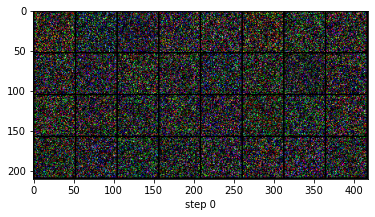


1it [00:01,  1.04s/it]
2it [00:01,  1.24it/s]
3it [00:02,  1.35it/s]
4it [00:02,  1.78it/s]
5it [00:02,  2.18it/s]
6it [00:03,  2.60it/s]
7it [00:03,  2.85it/s]
8it [00:03,  3.13it/s]
9it [00:03,  3.20it/s]
10it [00:04,  3.09it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][10/388] Loss_D: 1.5350; Loss_G: 0.3699


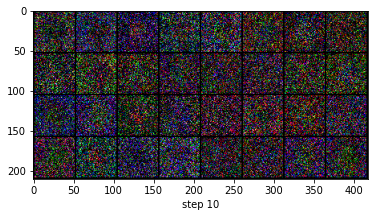


11it [00:05,  2.15it/s]
12it [00:05,  2.03it/s]
13it [00:06,  1.96it/s]
14it [00:06,  2.28it/s]
15it [00:06,  2.62it/s]
16it [00:07,  2.86it/s]
17it [00:07,  3.13it/s]
18it [00:07,  3.29it/s]
19it [00:07,  3.33it/s]
20it [00:08,  3.42it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][20/388] Loss_D: 1.5803; Loss_G: 0.3559


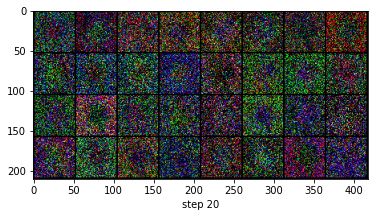


21it [00:08,  2.46it/s]
22it [00:09,  2.52it/s]
23it [00:09,  2.72it/s]
24it [00:09,  2.98it/s]
25it [00:09,  3.13it/s]
26it [00:10,  3.19it/s]
27it [00:10,  3.21it/s]
28it [00:10,  3.24it/s]
29it [00:11,  3.24it/s]
30it [00:11,  3.33it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][30/388] Loss_D: 1.4944; Loss_G: 0.4193


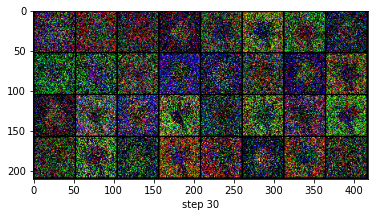


31it [00:12,  2.37it/s]
32it [00:12,  2.45it/s]
33it [00:12,  2.77it/s]
34it [00:13,  3.03it/s]
35it [00:13,  3.19it/s]
36it [00:13,  3.40it/s]
37it [00:13,  3.56it/s]
38it [00:14,  3.65it/s]
39it [00:14,  3.58it/s]
40it [00:14,  3.54it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][40/388] Loss_D: 1.4771; Loss_G: 0.4396


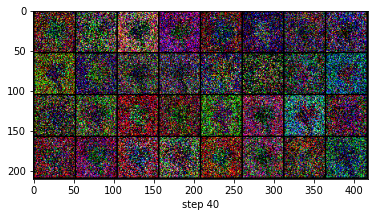


41it [00:15,  2.41it/s]
42it [00:15,  2.49it/s]
43it [00:16,  2.72it/s]
44it [00:16,  2.99it/s]
45it [00:16,  3.08it/s]
46it [00:16,  3.15it/s]
47it [00:17,  3.21it/s]
48it [00:17,  3.25it/s]
49it [00:17,  3.24it/s]
50it [00:18,  3.33it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][50/388] Loss_D: 1.4947; Loss_G: 0.4186


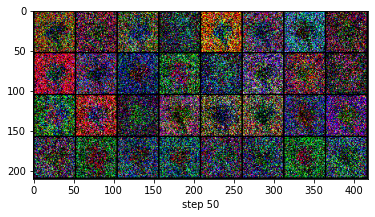


51it [00:18,  2.35it/s]
52it [00:19,  2.45it/s]
53it [00:19,  2.66it/s]
54it [00:19,  2.86it/s]
55it [00:20,  3.10it/s]
56it [00:20,  3.27it/s]
57it [00:20,  3.43it/s]
58it [00:20,  3.52it/s]
59it [00:21,  3.51it/s]
60it [00:21,  3.41it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][60/388] Loss_D: 1.5385; Loss_G: 0.3825


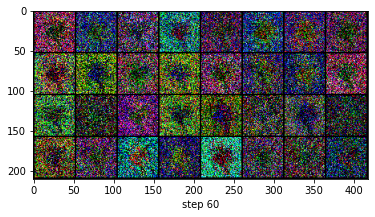


61it [00:22,  2.38it/s]
62it [00:22,  2.54it/s]
63it [00:22,  2.69it/s]
64it [00:23,  2.89it/s]
65it [00:23,  3.03it/s]
66it [00:23,  3.24it/s]
67it [00:23,  3.40it/s]
68it [00:24,  3.40it/s]
69it [00:24,  3.36it/s]
70it [00:24,  3.39it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][70/388] Loss_D: 1.5163; Loss_G: 0.3885


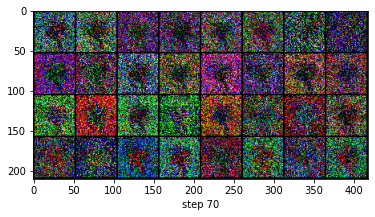


71it [00:25,  2.35it/s]
72it [00:25,  2.46it/s]
73it [00:26,  2.81it/s]
74it [00:26,  3.04it/s]
75it [00:26,  3.24it/s]
76it [00:26,  3.44it/s]
77it [00:27,  3.65it/s]
78it [00:27,  3.59it/s]
79it [00:27,  3.67it/s]
80it [00:28,  3.54it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][80/388] Loss_D: 1.4929; Loss_G: 0.4194


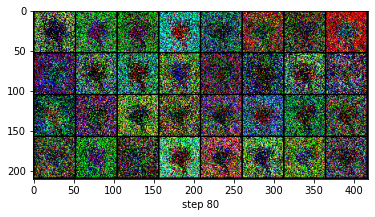


81it [00:28,  2.23it/s]
82it [00:29,  2.27it/s]
83it [00:29,  2.52it/s]
84it [00:29,  2.78it/s]
85it [00:30,  2.95it/s]
86it [00:30,  3.10it/s]
87it [00:30,  3.33it/s]
88it [00:30,  3.36it/s]
89it [00:31,  3.56it/s]
90it [00:31,  3.43it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][90/388] Loss_D: 1.5088; Loss_G: 0.4180


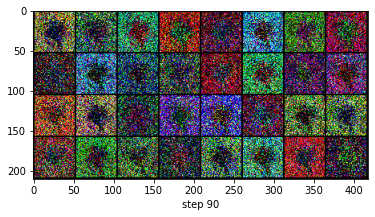


91it [00:32,  2.32it/s]
92it [00:32,  2.33it/s]
93it [00:32,  2.61it/s]
94it [00:33,  2.91it/s]
95it [00:33,  3.03it/s]
96it [00:33,  3.07it/s]
97it [00:34,  3.19it/s]
98it [00:34,  3.18it/s]
99it [00:34,  3.23it/s]
100it [00:35,  3.16it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][100/388] Loss_D: 1.5019; Loss_G: 0.4121


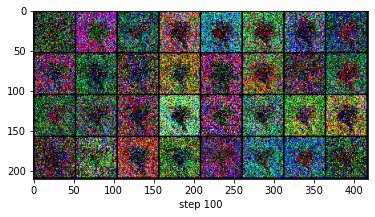


101it [00:35,  2.25it/s]
102it [00:36,  2.36it/s]
103it [00:36,  2.61it/s]
104it [00:36,  2.76it/s]
105it [00:37,  2.94it/s]
106it [00:37,  2.98it/s]
107it [00:37,  3.15it/s]
108it [00:37,  3.29it/s]
109it [00:38,  3.36it/s]
110it [00:38,  3.24it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][110/388] Loss_D: 1.4845; Loss_G: 0.4100


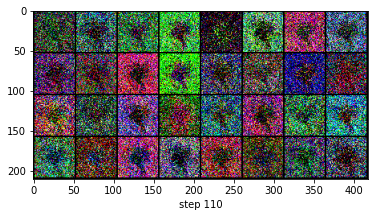


111it [00:39,  2.20it/s]
112it [00:39,  2.06it/s]
113it [00:40,  2.25it/s]
114it [00:40,  2.49it/s]
115it [00:40,  2.79it/s]
116it [00:41,  2.99it/s]
117it [00:41,  3.11it/s]
118it [00:41,  3.12it/s]
119it [00:41,  3.21it/s]
120it [00:42,  3.20it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][120/388] Loss_D: 1.5003; Loss_G: 0.4003


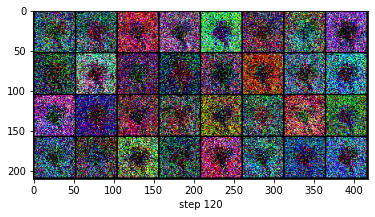


121it [00:43,  2.24it/s]
122it [00:43,  2.16it/s]
123it [00:44,  2.10it/s]
124it [00:44,  2.32it/s]
125it [00:44,  2.52it/s]
126it [00:45,  2.70it/s]
127it [00:45,  2.80it/s]
128it [00:45,  2.98it/s]
129it [00:45,  3.01it/s]
130it [00:46,  2.99it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][130/388] Loss_D: 1.5062; Loss_G: 0.4067


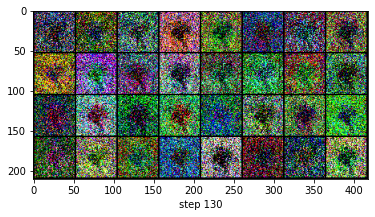


131it [00:47,  2.13it/s]
132it [00:47,  2.16it/s]
133it [00:47,  2.44it/s]
134it [00:48,  2.55it/s]
135it [00:48,  2.67it/s]
136it [00:48,  2.74it/s]
137it [00:49,  2.83it/s]
138it [00:49,  2.97it/s]
139it [00:49,  3.13it/s]
140it [00:50,  3.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][140/388] Loss_D: 1.4852; Loss_G: 0.4272


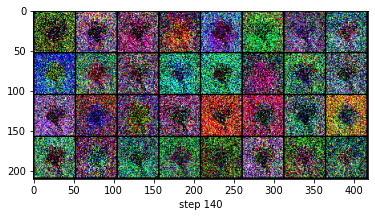


141it [00:50,  2.13it/s]
142it [00:51,  2.22it/s]
143it [00:51,  2.43it/s]
144it [00:51,  2.64it/s]
145it [00:52,  2.75it/s]
146it [00:52,  2.85it/s]
147it [00:52,  3.04it/s]
148it [00:53,  3.10it/s]
149it [00:53,  3.18it/s]
150it [00:53,  3.27it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][150/388] Loss_D: 1.4828; Loss_G: 0.4173


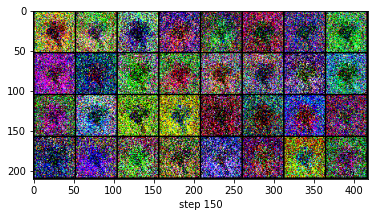


151it [00:54,  2.27it/s]
152it [00:54,  2.31it/s]
153it [00:55,  2.57it/s]
154it [00:55,  2.86it/s]
155it [00:55,  2.81it/s]
156it [00:56,  2.86it/s]
157it [00:56,  2.93it/s]
158it [00:56,  2.77it/s]
159it [00:57,  2.74it/s]
160it [00:57,  2.59it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][160/388] Loss_D: 1.4992; Loss_G: 0.4088


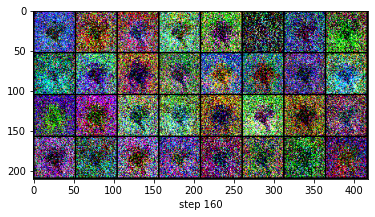


161it [00:58,  1.90it/s]
162it [00:58,  2.12it/s]
163it [00:59,  2.36it/s]
164it [00:59,  2.57it/s]
165it [00:59,  2.70it/s]
166it [01:00,  2.82it/s]
167it [01:00,  2.90it/s]
168it [01:00,  2.94it/s]
169it [01:01,  3.01it/s]
170it [01:01,  3.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][170/388] Loss_D: 1.5235; Loss_G: 0.3979


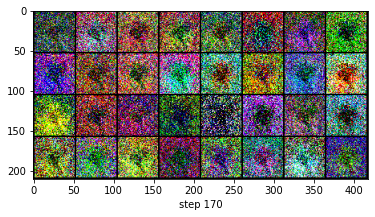


171it [01:02,  1.99it/s]
172it [01:02,  2.08it/s]
173it [01:03,  2.19it/s]
174it [01:03,  2.41it/s]
175it [01:03,  2.60it/s]
176it [01:04,  2.72it/s]
177it [01:04,  2.83it/s]
178it [01:04,  2.91it/s]
179it [01:05,  2.99it/s]
180it [01:05,  3.11it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][180/388] Loss_D: 1.5082; Loss_G: 0.4032


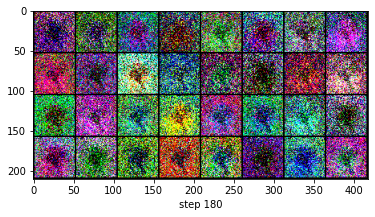


181it [01:06,  2.34it/s]
182it [01:06,  2.39it/s]
183it [01:06,  2.73it/s]
184it [01:06,  2.93it/s]
185it [01:07,  3.19it/s]
186it [01:07,  3.29it/s]
187it [01:07,  3.38it/s]
188it [01:08,  3.49it/s]
189it [01:08,  3.63it/s]
190it [01:08,  3.73it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][190/388] Loss_D: 1.5159; Loss_G: 0.4069


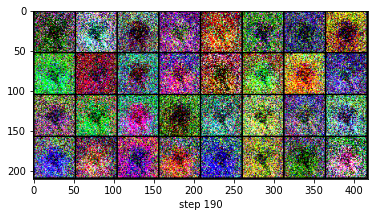


191it [01:09,  2.55it/s]
192it [01:09,  2.58it/s]
193it [01:09,  2.89it/s]
194it [01:10,  3.18it/s]
195it [01:10,  3.28it/s]
196it [01:10,  3.40it/s]
197it [01:10,  3.44it/s]
198it [01:11,  3.59it/s]
199it [01:11,  3.64it/s]
200it [01:11,  3.58it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][200/388] Loss_D: 1.5095; Loss_G: 0.4114


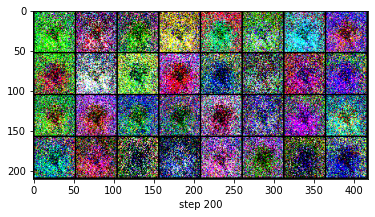


201it [01:12,  2.38it/s]
202it [01:12,  2.43it/s]
203it [01:13,  2.66it/s]
204it [01:13,  2.88it/s]
205it [01:13,  3.09it/s]
206it [01:13,  3.29it/s]
207it [01:14,  3.45it/s]
208it [01:14,  3.41it/s]
209it [01:14,  3.45it/s]
210it [01:15,  3.45it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][210/388] Loss_D: 1.5339; Loss_G: 0.3897


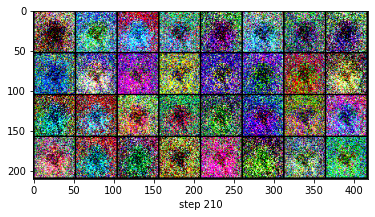


211it [01:15,  2.32it/s]
212it [01:16,  2.28it/s]
213it [01:16,  2.56it/s]
214it [01:16,  2.85it/s]
215it [01:17,  2.94it/s]
216it [01:17,  3.07it/s]
217it [01:17,  3.23it/s]
218it [01:17,  3.42it/s]
219it [01:18,  3.45it/s]
220it [01:18,  3.54it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][220/388] Loss_D: 1.5230; Loss_G: 0.3940


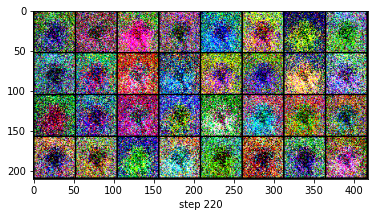


221it [01:19,  2.43it/s]
222it [01:19,  2.37it/s]
223it [01:19,  2.65it/s]
224it [01:20,  2.86it/s]
225it [01:20,  2.99it/s]
226it [01:20,  3.00it/s]
227it [01:21,  3.07it/s]
228it [01:21,  3.17it/s]
229it [01:21,  3.33it/s]
230it [01:22,  3.44it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][230/388] Loss_D: 1.5220; Loss_G: 0.4059


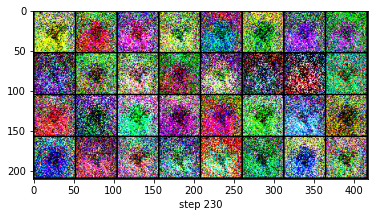


231it [01:22,  2.45it/s]
232it [01:23,  2.46it/s]
233it [01:23,  2.69it/s]
234it [01:23,  2.97it/s]
235it [01:23,  3.16it/s]
236it [01:24,  3.17it/s]
237it [01:24,  3.21it/s]
238it [01:24,  3.25it/s]
239it [01:25,  3.29it/s]
240it [01:25,  3.42it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][240/388] Loss_D: 1.4910; Loss_G: 0.4206


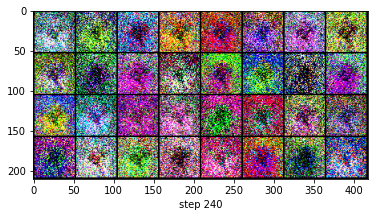


241it [01:26,  2.37it/s]
242it [01:26,  2.34it/s]
243it [01:26,  2.67it/s]
244it [01:27,  2.97it/s]
245it [01:27,  3.22it/s]
246it [01:27,  3.28it/s]
247it [01:27,  3.44it/s]
248it [01:28,  3.56it/s]
249it [01:28,  3.55it/s]
250it [01:28,  3.61it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][250/388] Loss_D: 1.5233; Loss_G: 0.4073


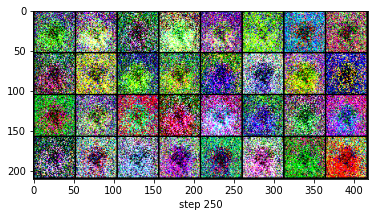


251it [01:29,  2.50it/s]
252it [01:29,  2.59it/s]
253it [01:29,  2.84it/s]
254it [01:30,  3.13it/s]
255it [01:30,  3.24it/s]
256it [01:30,  3.49it/s]
257it [01:31,  3.58it/s]
258it [01:31,  3.59it/s]
259it [01:31,  3.64it/s]
260it [01:31,  3.74it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][260/388] Loss_D: 1.5242; Loss_G: 0.3984


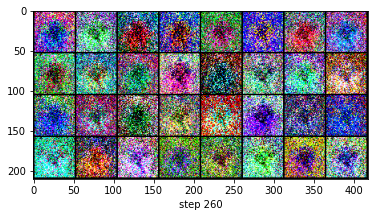


261it [01:32,  2.56it/s]
262it [01:32,  2.67it/s]
263it [01:33,  2.82it/s]
264it [01:33,  3.00it/s]
265it [01:33,  3.22it/s]
266it [01:33,  3.45it/s]
267it [01:34,  3.59it/s]
268it [01:34,  3.71it/s]
269it [01:34,  3.76it/s]
270it [01:34,  3.90it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][270/388] Loss_D: 1.5244; Loss_G: 0.3993


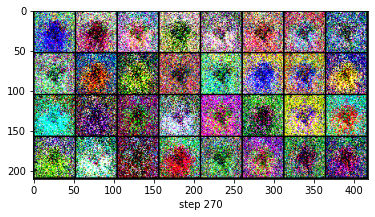


271it [01:35,  2.57it/s]
272it [01:35,  2.63it/s]
273it [01:36,  2.95it/s]
274it [01:36,  3.18it/s]
275it [01:36,  3.39it/s]
276it [01:36,  3.55it/s]
277it [01:37,  3.71it/s]
278it [01:37,  3.66it/s]
279it [01:37,  3.83it/s]
280it [01:37,  3.87it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][280/388] Loss_D: 1.4965; Loss_G: 0.4122


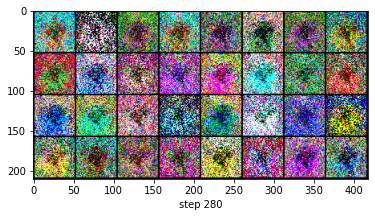


281it [01:38,  2.56it/s]
282it [01:38,  2.71it/s]
283it [01:39,  3.00it/s]
284it [01:39,  3.15it/s]
285it [01:39,  3.26it/s]
286it [01:40,  3.39it/s]
287it [01:40,  3.52it/s]
288it [01:40,  3.62it/s]
289it [01:40,  3.66it/s]
290it [01:41,  3.79it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][290/388] Loss_D: 1.5078; Loss_G: 0.4139


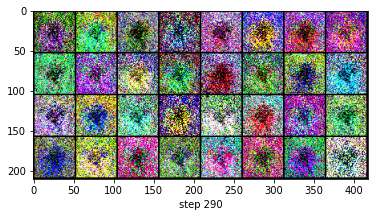


291it [01:41,  2.60it/s]
292it [01:42,  2.71it/s]
293it [01:42,  2.85it/s]
294it [01:42,  2.95it/s]
295it [01:42,  3.09it/s]
296it [01:43,  3.31it/s]
297it [01:43,  3.40it/s]
298it [01:43,  3.44it/s]
299it [01:44,  3.50it/s]
300it [01:44,  3.58it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][300/388] Loss_D: 1.5189; Loss_G: 0.4066


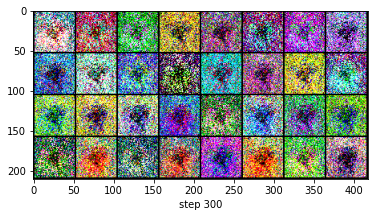


301it [01:44,  2.53it/s]
302it [01:45,  2.69it/s]
303it [01:45,  2.92it/s]
304it [01:45,  3.17it/s]
305it [01:46,  3.30it/s]
306it [01:46,  3.48it/s]
307it [01:46,  3.44it/s]
308it [01:46,  3.44it/s]
309it [01:47,  3.56it/s]
310it [01:47,  3.58it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][310/388] Loss_D: 1.5209; Loss_G: 0.4019


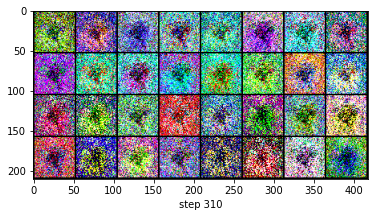


311it [01:48,  2.52it/s]
312it [01:48,  2.57it/s]
313it [01:48,  2.88it/s]
314it [01:49,  3.03it/s]
315it [01:49,  3.24it/s]
316it [01:49,  3.47it/s]
317it [01:49,  3.64it/s]
318it [01:50,  3.75it/s]
319it [01:50,  3.82it/s]
320it [01:50,  3.73it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][320/388] Loss_D: 1.5088; Loss_G: 0.4121


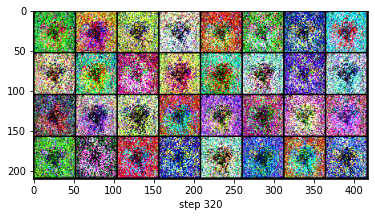


321it [01:51,  2.43it/s]
322it [01:51,  2.41it/s]
323it [01:52,  2.56it/s]
324it [01:52,  2.38it/s]
325it [01:52,  2.56it/s]
326it [01:53,  2.77it/s]
327it [01:53,  2.98it/s]
328it [01:53,  3.18it/s]
329it [01:53,  3.38it/s]
330it [01:54,  3.52it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][330/388] Loss_D: 1.4948; Loss_G: 0.4162


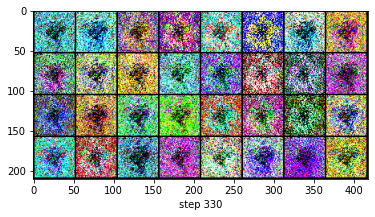


331it [01:54,  2.49it/s]
332it [01:55,  2.50it/s]
333it [01:55,  2.72it/s]
334it [01:55,  2.94it/s]
335it [01:56,  3.05it/s]
336it [01:56,  3.01it/s]
337it [01:56,  3.15it/s]
338it [01:57,  3.28it/s]
339it [01:57,  3.35it/s]
340it [01:57,  3.56it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][340/388] Loss_D: 1.5084; Loss_G: 0.4021


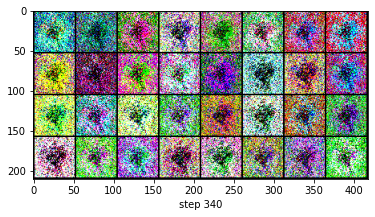


341it [01:58,  2.50it/s]
342it [01:58,  2.46it/s]
343it [01:58,  2.78it/s]
344it [01:59,  3.08it/s]
345it [01:59,  3.21it/s]
346it [01:59,  3.37it/s]
347it [02:00,  3.42it/s]
348it [02:00,  3.45it/s]
349it [02:00,  3.58it/s]
350it [02:00,  3.50it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][350/388] Loss_D: 1.5247; Loss_G: 0.4026


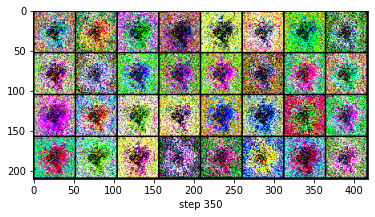


351it [02:01,  2.46it/s]
352it [02:02,  2.42it/s]
353it [02:02,  2.59it/s]
354it [02:02,  2.87it/s]c:\users\asus\documents\deep learning\deep_learn\lib\site-packages\PIL\TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  warnings.warn(
c:\users\asus\documents\deep learning\deep_learn\lib\site-packages\PIL\TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  warnings.warn(
c:\users\asus\documents\deep learning\deep_learn\lib\site-packages\PIL\TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  warnings.warn(
c:\users\asus\documents\deep learning\deep_learn\lib\site-packages\PIL\TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  warnings.warn(
c:\users\asus\documents\deep learning\deep_lear

[0/1][360/388] Loss_D: 1.4957; Loss_G: 0.4152


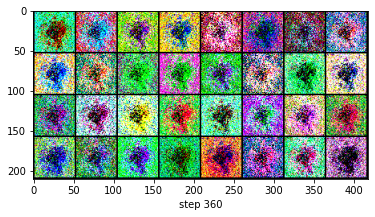


361it [02:04,  2.52it/s]
362it [02:05,  2.55it/s]
363it [02:05,  2.81it/s]
364it [02:05,  2.99it/s]
365it [02:06,  3.10it/s]
366it [02:06,  3.20it/s]
367it [02:06,  3.26it/s]
368it [02:06,  3.39it/s]
369it [02:07,  3.45it/s]
370it [02:07,  3.34it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][370/388] Loss_D: 1.5351; Loss_G: 0.4002


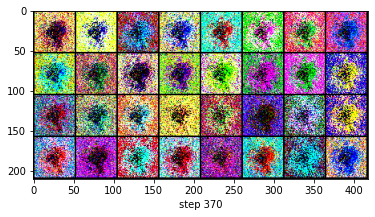


371it [02:08,  2.33it/s]
372it [02:08,  2.32it/s]
373it [02:08,  2.59it/s]
374it [02:09,  2.87it/s]
375it [02:09,  3.07it/s]
376it [02:09,  3.17it/s]
377it [02:10,  3.19it/s]
378it [02:10,  3.26it/s]
379it [02:10,  3.26it/s]
380it [02:10,  3.42it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0/1][380/388] Loss_D: 1.5369; Loss_G: 0.3917


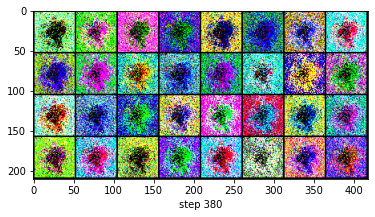


381it [02:11,  2.32it/s]
382it [02:12,  2.38it/s]
383it [02:12,  2.55it/s]
384it [02:12,  2.75it/s]
385it [02:13,  2.90it/s]
386it [02:13,  3.02it/s]
387it [02:13,  2.90it/s]
  0%|                                                              | 0/1 [02:13<?, ?it/s]


RuntimeError: shape '[96]' is invalid for input of size 42

In [9]:
Loss_g = []
Loss_d = []

# RUNNING THIS THING GAVE ME AN ERROR SO I CHANGE THE DISCRIMINATOR OR USE TESTING TO CHECK FOR ERRORS

for i in tqdm(range(epochs)):
    for j,(images,_) in tqdm(enumerate(train_loader)):
        realimage = images.to(device)
        realimage = realimage.view(-1,2500).to(device)
        fake_label = torch.ones(realimage.shape[0])
        disc_out_real = disc(realimage).view(96)
        err_dreal = criterion(disc_out_real,fake_label)
        # Training the discriminator with a fake image generated by the generator
        noise = torch.randn(realimage.shape[0],z_dim)
        fake_img = gen(noise)
        fake_label = torch.zeros(realimage.size()[0])
        disc_out_fake = disc(fake_img.detach()).view(-1)#I think we detach to retain the gradient correct me if i am wrong
        err_dfake = criterion(disc_out_fake,fake_label)
        # now backpropagating error
        errD = err_dreal + err_dfake
        errD.backward()
        d_opt.step()
        
        ## TRaining Generator
        gen.zero_grad()
        target = torch.ones(realimage.size()[0])
        output = disc(fake_img).view(-1)
        errG = criterion(output, target)
        errG.backward()
        g_opt.step()
        Loss_g.append(errG)
        Loss_d.append(errD)
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        if j % 10 == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (i, epochs, j, len(train_loader), errD.item(), errG.item()))
            size=(3,50,50)
            plt.imshow(make_grid(fake_img.detach().cpu().view(32,*size)).permute(1, 2, 0).squeeze())
            vutils.save_image(realimage, '%s/real_samples.png' % "./results", normalize=True)
            fake = gen(noise)
            plt.xlabel(f'step {j}')
            vutils.save_image(fake_img.data, '%s/fake_samples_epoch_%03d.png' % ("./results", i), normalize=True)
            plt.show()
        
            


In [10]:
torch.save(gen.state_dict(),'GanDog.pth')

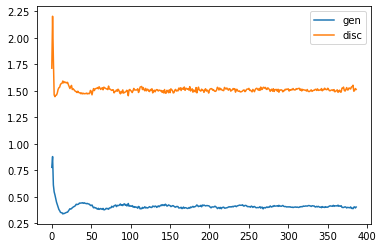

In [11]:
plt.plot(Loss_g,label='gen')
plt.plot(Loss_d,label='disc')
plt.legend()
plt.show()

In [13]:
noise = torch.randn((batch_size,z_dim))

In [14]:
show(make_grid(gen(noise).detach()))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 50, 50])


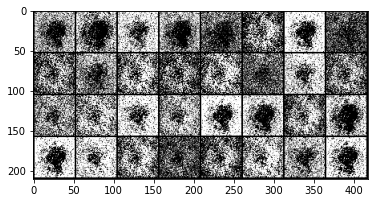

In [16]:
size = (1,50,50)
grid = gen(noise).detach().cpu().view(32,*size)
print(grid.shape)
image_grid = make_grid(grid)
plt.imshow(image_grid.permute(1, 2, 0).squeeze())